# Generación de Imágenes de Productos con Diffusers

**Proyecto:** Uso de `diffusers` de HuggingFace para generar imágenes de productos e-commerce.

**Técnicas aplicadas:**
- Text-to-Image con Stable Diffusion v1.5
- Ingeniería de prompts, negative prompts y seeds
- Experimentación con schedulers (`EulerAncestral`, `DPMSolver`, `DDIM`)
- Image-to-Image para variaciones de producto
- Optimización de parámetros con medición de tiempos

**Modelo:** `stable-diffusion-v1-5/stable-diffusion-v1-5` — acceso libre, sin token.

## 1. Instalación de dependencias

Se fijan versiones **mínimas y máximas** para máxima reproducibilidad.
También se genera un `requirements.txt` con los rangos usados.


In [1]:
%pip install \
    "diffusers>=0.25.0,<0.32.0" \
    "torch>=2.0.0,<3.0.0" \
    "transformers>=4.36.0,<4.46.0" \
    "accelerate>=0.25.0,<1.2.0" \
    "pillow>=10.0.0,<11.0.0" \
    "pandas>=2.0.0,<3.0.0" \
    requests -q

# Genera requirements.txt para referencia futura
req_content = """diffusers>=0.25.0,<0.32.0
torch>=2.0.0,<3.0.0
transformers>=4.36.0,<4.46.0
accelerate>=0.25.0,<1.2.0
pillow>=10.0.0,<11.0.0
pandas>=2.0.0,<3.0.0
requests
"""
with open("requirements.txt", "w") as f:
    f.write(req_content)
print("requirements.txt generado.")


Note: you may need to restart the kernel to use updated packages.
requirements.txt generado.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mangadex-downloader 3.1.4 requires Pillow==11.1.0, but you have pillow 10.4.0 which is incompatible.
pillow-heif 1.3.0 requires pillow>=11.1.0, but you have pillow 10.4.0 which is incompatible.

[notice] A new release of pip is available: 24.2 -> 26.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## 2. Configuración del entorno

In [2]:
import os
import time
import torch
import requests
from io import BytesIO
from PIL import Image
from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionImg2ImgPipeline,
    EulerAncestralDiscreteScheduler,
    DPMSolverMultistepScheduler,
    DDIMScheduler,
)
from diffusers.utils import make_image_grid

MODEL_ID   = "stable-diffusion-v1-5/stable-diffusion-v1-5"
OUTPUT_DIR = "ecommerce_generated_images"
os.makedirs(OUTPUT_DIR, exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DTYPE  = torch.float16 if DEVICE == "cuda" else torch.float32

# -- Parametros adaptados al dispositivo ------------------------------------
# En CPU se reduce resolucion y steps para evitar tiempos excesivos
if DEVICE == "cuda":
    DEFAULT_W, DEFAULT_H = 512, 512
    DEFAULT_STEPS        = 20      # rapido y suficiente para comparativas
    FAST_STEPS           = 15      # para bucles de experimentacion
else:
    DEFAULT_W, DEFAULT_H = 384, 384
    DEFAULT_STEPS        = 10
    FAST_STEPS           = 8

print(f"Modelo     : {MODEL_ID}")
print(f"Dispositivo: {DEVICE} | dtype: {DTYPE}")
print(f"Resolucion : {DEFAULT_W}x{DEFAULT_H} | Steps base: {DEFAULT_STEPS} | Steps rapido: {FAST_STEPS}")

if DEVICE == "cuda":
    print(f"GPU        : {torch.cuda.get_device_name(0)}")
    vram_gb = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"VRAM       : {vram_gb:.1f} GB")

C:\Users\macdu\AppData\Roaming\Python\Python313\site-packages\requests\__init__.py:113: RequestsDependencyWarning: urllib3 (2.6.3) or chardet (7.4.3)/charset_normalizer (3.4.5) doesn't match a supported version!
  warnings.warn(
C:\Users\macdu\AppData\Roaming\Python\Python313\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.
0it [00:00, ?it/s]


Modelo     : stable-diffusion-v1-5/stable-diffusion-v1-5
Dispositivo: cpu | dtype: torch.float32
Resolucion : 384x384 | Steps base: 10 | Steps rapido: 8


## 3. Carga del modelo y optimizaciones de memoria

Se aplica `enable_attention_slicing()` siempre. En GPU con poca VRAM (< 6 GB)
se activa adicionalmente `enable_vae_tiling()` y `enable_model_cpu_offload()`.

In [3]:
# ── Scheduler inicial ────────────────────────────────────────────────────
scheduler = EulerAncestralDiscreteScheduler.from_pretrained(
    MODEL_ID, subfolder="scheduler"
)

# ── Carga del modelo con control de errores ───────────────────────────────
try:
    pipe_txt2img = StableDiffusionPipeline.from_pretrained(
        MODEL_ID,
        scheduler=scheduler,
        torch_dtype=DTYPE,
        safety_checker=None,
        requires_safety_checker=False,
    )
except OSError as e:
    raise RuntimeError(
        f"\n[ERROR] No se pudo descargar el modelo '{MODEL_ID}'.\n"
        f"  Posibles causas:\n"
        f"    - Sin conexión a internet o HuggingFace Hub caído.\n"
        f"    - Nombre de modelo incorrecto.\n"
        f"    - Espacio en disco insuficiente (~4 GB necesarios).\n"
        f"  Detalle técnico: {e}"
    ) from e
except Exception as e:
    raise RuntimeError(
        f"\n[ERROR] Fallo inesperado al cargar el modelo: {type(e).__name__}: {e}"
    ) from e

# Optimización de memoria
pipe_txt2img.enable_attention_slicing()

if DEVICE == "cuda":
    vram_gb = torch.cuda.get_device_properties(0).total_memory / 1e9
    if vram_gb < 6:
        print(f"[INFO] VRAM < 6 GB ({vram_gb:.1f} GB) -- activando cpu_offload y vae_tiling")
        pipe_txt2img.enable_model_cpu_offload()
        pipe_txt2img.enable_vae_tiling()
    else:
        pipe_txt2img = pipe_txt2img.to(DEVICE)
else:
    pipe_txt2img = pipe_txt2img.to(DEVICE)

print("Pipeline txt2img cargado correctamente.")


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  8.26it/s]

Pipeline txt2img cargado correctamente.


## 4. Funciones auxiliares

In [4]:
def generate(pipe, prompt, negative_prompt, steps=None, guidance=7.5, seed=42,
             width=None, height=None):
    """Genera una imagen text-to-image. Usa DEFAULT_STEPS y resolucion si no se especifican."""
    steps  = steps  or DEFAULT_STEPS
    width  = width  or DEFAULT_W
    height = height or DEFAULT_H
    generator = torch.Generator(device=DEVICE).manual_seed(seed)
    result = pipe(
        prompt              = prompt,
        negative_prompt     = negative_prompt,
        num_inference_steps = steps,
        guidance_scale      = guidance,
        width               = width,
        height              = height,
        generator           = generator,
    )
    return result.images[0]


def timed_generate(pipe, prompt, negative_prompt, steps, guidance=7.5, seed=42,
                   width=None, height=None):
    """Como generate() pero devuelve (imagen, segundos_transcurridos)."""
    t0  = time.time()
    img = generate(pipe, prompt, negative_prompt, steps, guidance, seed, width, height)
    return img, round(time.time() - t0, 1)


def save_and_show(image, filename, title=None):
    path = os.path.join(OUTPUT_DIR, filename)
    image.save(path)
    if title:
        print(title)
    print(f"  -> {path}")
    display(image)
    return image


BASE_NEGATIVE = (
    "blurry, low quality, watermark, text, logo, signature, "
    "deformed, ugly, bad anatomy, extra limbs, clutter, messy background, "
    "oversaturated, noisy, pixelated"
)



# ── Control de batch para escalado seguro (MEJORA 5) ─────────────────────
MAX_BATCH_SIZE = 4  # Limitar para evitar OOM al escalar

def generate_batch(pipe, prompts, negative_prompt, steps=None, guidance=7.5,
                   seeds=None, width=None, height=None, batch_size=None):
    """
    Genera múltiples imágenes dividiendo en mini-batches seguros.
    
    Args:
        prompts    : lista de prompts
        seeds      : lista de seeds (o None -> auto-incremento desde 0)
        batch_size : tamaño máximo de mini-batch (default: MAX_BATCH_SIZE)
    Returns:
        Lista de PIL.Image
    """
    batch_size = min(batch_size or MAX_BATCH_SIZE, MAX_BATCH_SIZE)
    seeds = seeds or list(range(len(prompts)))
    all_images = []

    for start in range(0, len(prompts), batch_size):
        chunk_prompts = prompts[start:start + batch_size]
        chunk_seeds   = seeds[start:start + batch_size]
        print(f"  Batch {start//batch_size + 1}: {len(chunk_prompts)} imagen(es)")
        for p, s in zip(chunk_prompts, chunk_seeds):
            img = generate(pipe, p, negative_prompt, steps, guidance, s, width, height)
            all_images.append(img)

    return all_images


print(f"Funciones auxiliares listas. MAX_BATCH_SIZE={MAX_BATCH_SIZE}")


Funciones auxiliares listas. MAX_BATCH_SIZE=4


## 3b. Configuración centralizada de experimentos

Todos los prompts, seeds y parámetros se definen aquí. Para cambiar de modelo
o scheduler basta con modificar `MODEL_ID` o `DEFAULT_SCHEDULER_CLS` arriba
y volver a ejecutar desde esta celda.


In [5]:
# ════════════════════════════════════════════════════════════════════════
# CONFIGURACIÓN CENTRALIZADA DE EXPERIMENTOS
# Modifica aquí para repetir todos los experimentos con otro modelo/scheduler
# ════════════════════════════════════════════════════════════════════════

EXPERIMENTS = [
    # ── Productos base ──────────────────────────────────────────────────
    {
        "id"       : "zapatillas_base",
        "section"  : "base_products",
        "prompt"   : (
            "A high-resolution product photo of modern running sneakers "
            "on a white background, studio lighting, sharp focus, "
            "e-commerce style, photorealistic"
        ),
        "guidance" : 8.0,
        "seed"     : 42,
    },
    {
        "id"       : "bolso_lujo",
        "section"  : "base_products",
        "prompt"   : (
            "A luxury leather handbag with gold accents, studio lighting, "
            "white background, product photography, high detail, photorealistic"
        ),
        "guidance" : 8.5,
        "seed"     : 100,
    },
    # ── Nuevos productos adicionales (MEJORA 4) ──────────────────────────
    {
        "id"       : "reloj_lujo",
        "section"  : "base_products",
        "prompt"   : (
            "A luxury Swiss watch with leather strap on a white background, "
            "macro photography, studio lighting, sharp focus, "
            "product photo, photorealistic, e-commerce"
        ),
        "guidance" : 8.5,
        "seed"     : 77,
    },
    {
        "id"       : "gafas_sol",
        "section"  : "base_products",
        "prompt"   : (
            "Designer sunglasses with mirrored lenses on a white background, "
            "studio lighting, high detail, product photography, photorealistic"
        ),
        "guidance" : 8.0,
        "seed"     : 88,
    },
    {
        "id"       : "auriculares_bt",
        "section"  : "base_products",
        "prompt"   : (
            "Premium wireless over-ear headphones in matte black on a white "
            "background, studio lighting, product photography, high detail, "
            "photorealistic, e-commerce style"
        ),
        "guidance" : 8.0,
        "seed"     : 99,
    },
    # ── Variaciones de prompts (sección 6) ───────────────────────────────
    {
        "id"       : "zapatillas_rojo_neon",
        "section"  : "prompt_experiments",
        "prompt"   : (
            "A high-resolution product photo of neon red running sneakers, "
            "white background, studio lighting, sport style, e-commerce, photorealistic"
        ),
        "guidance" : 7.5,
        "seed"     : 42,
    },
    {
        "id"       : "zapatillas_minimalista",
        "section"  : "prompt_experiments",
        "prompt"   : (
            "Minimalist white sneakers on a clean white surface, "
            "top-down perspective, soft shadows, luxury product photography"
        ),
        "guidance" : 7.5,
        "seed"     : 42,
    },
    {
        "id"       : "zapatillas_outdoor",
        "section"  : "prompt_experiments",
        "prompt"   : (
            "Rugged outdoor trail running shoes with thick soles, "
            "isolated on white background, detailed texture, photorealistic"
        ),
        "guidance" : 7.5,
        "seed"     : 42,
    },
]

# Índice para acceso rápido por id
EXPERIMENTS_BY_ID = {e["id"]: e for e in EXPERIMENTS}
print(f"Experimentos registrados: {len(EXPERIMENTS)}")
for exp in EXPERIMENTS:
    print(f"  [{exp['section']:20s}] {exp['id']}")


Experimentos registrados: 8
  [base_products       ] zapatillas_base
  [base_products       ] bolso_lujo
  [base_products       ] reloj_lujo
  [base_products       ] gafas_sol
  [base_products       ] auriculares_bt
  [prompt_experiments  ] zapatillas_rojo_neon
  [prompt_experiments  ] zapatillas_minimalista
  [prompt_experiments  ] zapatillas_outdoor


## 5. Generación de imágenes de producto

### 5.1 Producto base: zapatillas deportivas

100%|██████████| 10/10 [00:46<00:00,  4.63s/it]


Zapatillas deportivas - imagen base
  -> ecommerce_generated_images\zapatillas_base.png


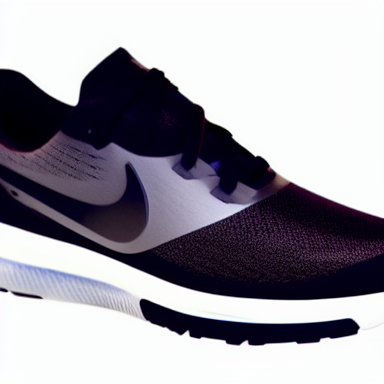

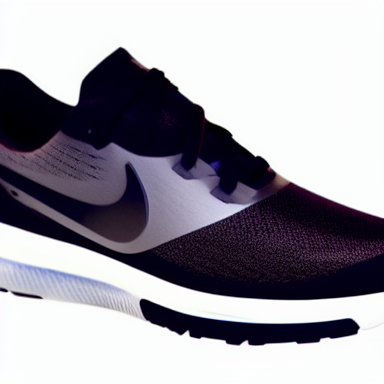

In [6]:
prompt_zapatillas = (
    "A high-resolution product photo of modern running sneakers on a white background, "
    "studio lighting, sharp focus, e-commerce style, photorealistic"
)

img_zapatillas = generate(
    pipe_txt2img,
    prompt          = prompt_zapatillas,
    negative_prompt = BASE_NEGATIVE,
    guidance        = 8.0,
    seed            = 42,
)

save_and_show(img_zapatillas, "zapatillas_base.png", "Zapatillas deportivas - imagen base")

### 5.2 Segundo producto: bolso de lujo

100%|██████████| 10/10 [00:52<00:00,  5.25s/it]


Bolso de lujo
  -> ecommerce_generated_images\bolso_lujo.png


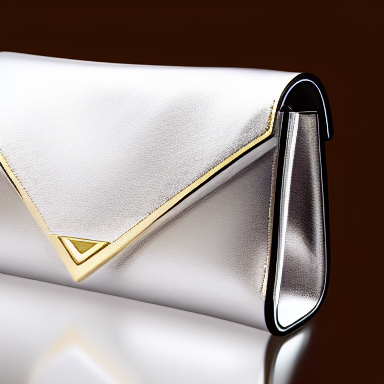

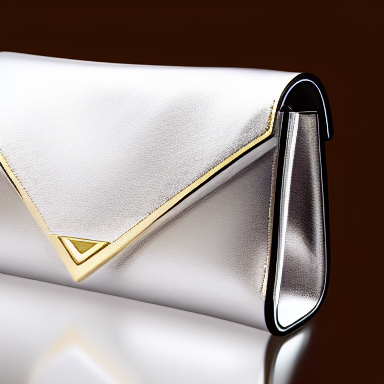

In [7]:
prompt_bolso = (
    "A luxury leather handbag with gold accents, studio lighting, white background, "
    "product photography, high detail, photorealistic"
)

img_bolso = generate(
    pipe_txt2img,
    prompt          = prompt_bolso,
    negative_prompt = BASE_NEGATIVE,
    guidance        = 8.5,
    seed            = 100,
)

save_and_show(img_bolso, "bolso_lujo.png", "Bolso de lujo")

### 5.3 Productos adicionales: reloj, gafas y auriculares

Ampliamos el catálogo con accesorios tecnológicos y de moda para demostrar
la versatilidad del modelo en distintas categorías de e-commerce.


Generando: reloj_lujo


100%|██████████| 10/10 [00:58<00:00,  5.86s/it]


reloj_lujo
  -> ecommerce_generated_images\reloj_lujo.png


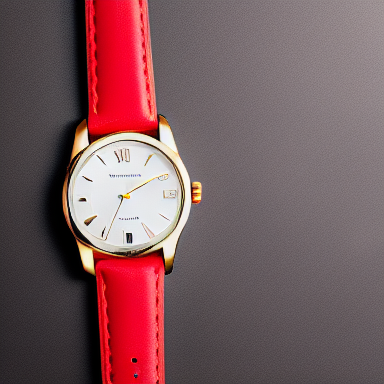

Generando: gafas_sol


100%|██████████| 10/10 [00:59<00:00,  5.94s/it]


gafas_sol
  -> ecommerce_generated_images\gafas_sol.png


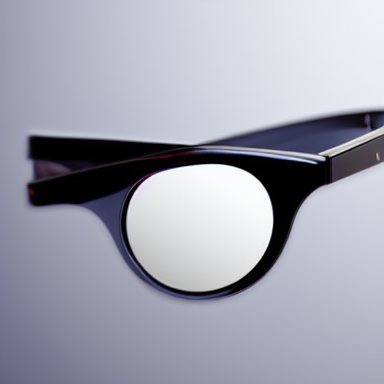

Generando: auriculares_bt


100%|██████████| 10/10 [00:57<00:00,  5.77s/it]


auriculares_bt
  -> ecommerce_generated_images\auriculares_bt.png


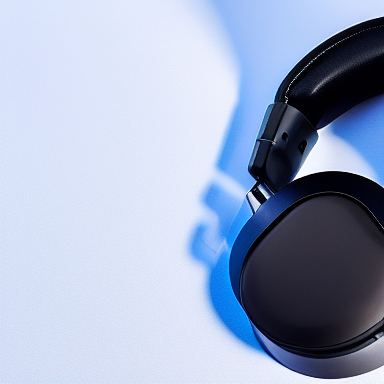

Nuevos productos: Reloj | Gafas | Auriculares
  -> ecommerce_generated_images\grid_productos_adicionales.png


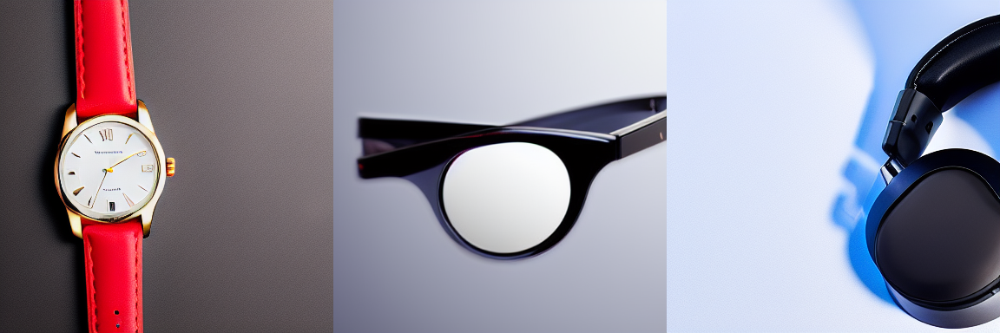

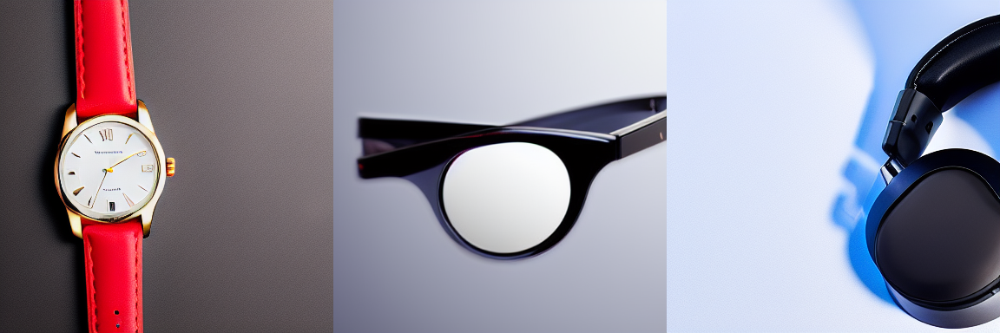

In [8]:
base_product_exps = [e for e in EXPERIMENTS if e["section"] == "base_products"
                      and e["id"] not in ("zapatillas_base", "bolso_lujo")]

imgs_base_extra = {}
for exp in base_product_exps:
    print(f"Generando: {exp['id']}")
    img = generate(
        pipe_txt2img,
        prompt          = exp["prompt"],
        negative_prompt = BASE_NEGATIVE,
        guidance        = exp["guidance"],
        seed            = exp["seed"],
    )
    imgs_base_extra[exp["id"]] = img
    save_and_show(img, f"{exp['id']}.png", exp["id"])

grid_extra = make_image_grid(list(imgs_base_extra.values()), rows=1, cols=len(imgs_base_extra))
save_and_show(grid_extra, "grid_productos_adicionales.png",
              "Nuevos productos: Reloj | Gafas | Auriculares")


## 6. Experimentación con prompts

Dos modos de experimentación:
- **Comparabilidad** (misma seed): detectar el efecto puro del prompt, manteniendo el resto constante.
- **Diversidad** (seeds distintas): explorar el espacio de resultados posibles para cada estilo.

=== Modo comparabilidad (seed=42 fija) ===
  Generando: zapatillas_rojo_neon


100%|██████████| 8/8 [00:49<00:00,  6.13s/it]


  -> ecommerce_generated_images\zapatillas_rojo_neon.png


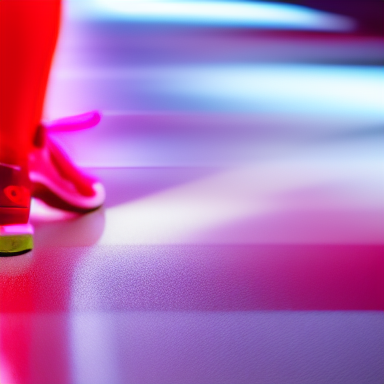

  Generando: zapatillas_minimalista


100%|██████████| 8/8 [00:46<00:00,  5.81s/it]


  -> ecommerce_generated_images\zapatillas_minimalista.png


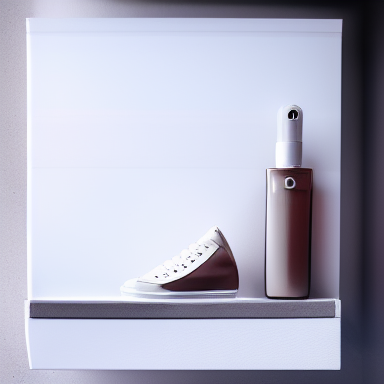

  Generando: zapatillas_outdoor


100%|██████████| 8/8 [00:46<00:00,  5.78s/it]


  -> ecommerce_generated_images\zapatillas_outdoor.png


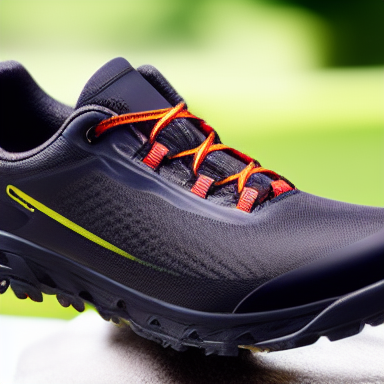

Comparabilidad: Neon | Minimalista | Outdoor (seed=42)
  -> ecommerce_generated_images\grid_prompts_comparables.png


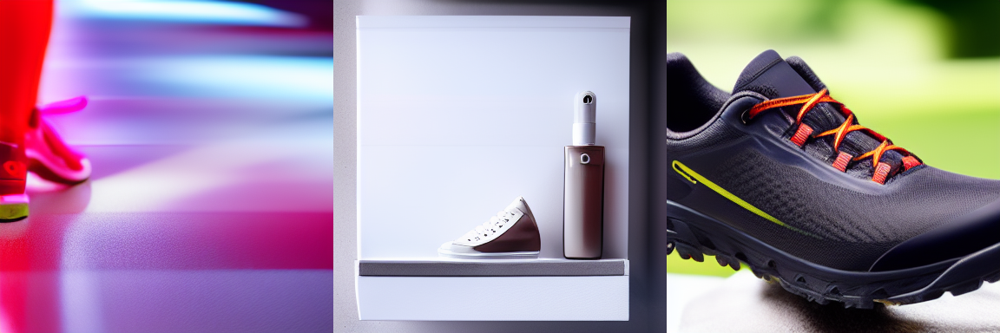


=== Modo diversidad (seeds distintas, mismo prompt) ===
  Generando: zapatillas_rojo_neon_v2 (seed=200)


100%|██████████| 8/8 [00:46<00:00,  5.77s/it]


  -> ecommerce_generated_images\zapatillas_rojo_neon_v2.png


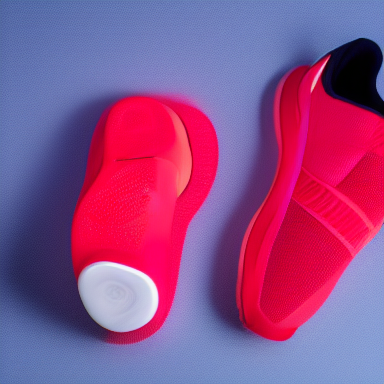

  Generando: zapatillas_rojo_neon_v3 (seed=300)


100%|██████████| 8/8 [00:45<00:00,  5.73s/it]


  -> ecommerce_generated_images\zapatillas_rojo_neon_v3.png


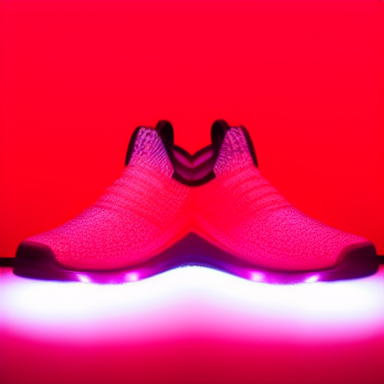

Diversidad: mismo prompt, seeds 42 | 200 | 300
  -> ecommerce_generated_images\grid_prompts_diversidad.png


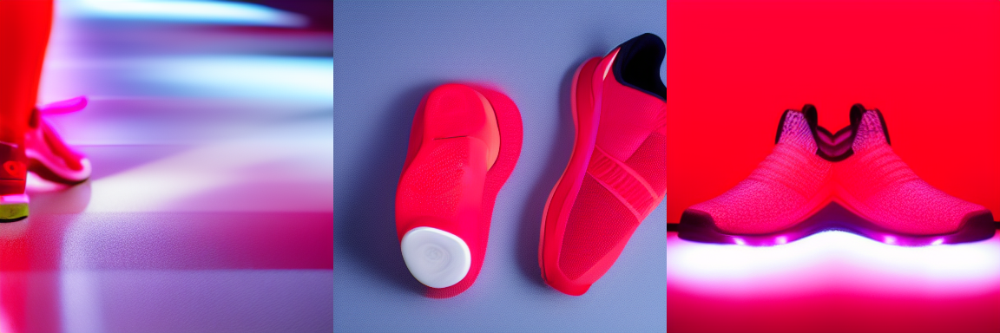

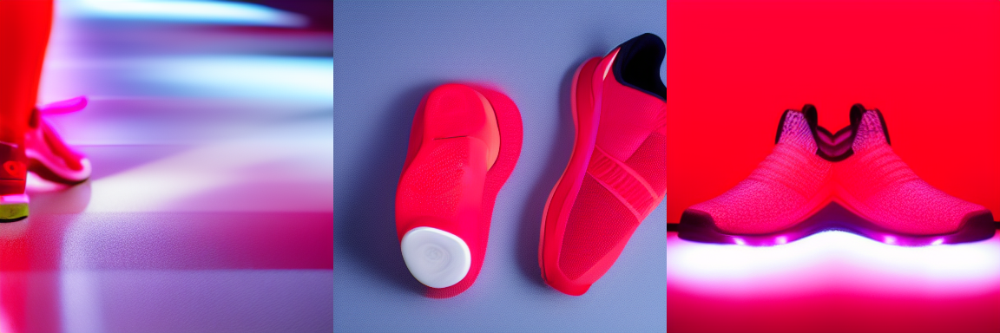

In [9]:
# -- Modo comparabilidad: misma seed, distintos prompts --------------------
# Objetivo: ver el efecto aislado del prompt sin ruido de seed
variaciones_comparables = {
    "zapatillas_rojo_neon": (
        "A high-resolution product photo of neon red running sneakers, "
        "white background, studio lighting, sport style, e-commerce, photorealistic",
        42   # misma seed
    ),
    "zapatillas_minimalista": (
        "Minimalist white sneakers on a clean white surface, "
        "top-down perspective, soft shadows, luxury product photography",
        42   # misma seed
    ),
    "zapatillas_outdoor": (
        "Rugged outdoor trail running shoes with thick soles, "
        "isolated on white background, detailed texture, photorealistic",
        42   # misma seed
    ),
}

# -- Modo diversidad: seeds distintas, mismo estilo ------------------------
# Objetivo: explorar variaciones visuales de un mismo concepto
variaciones_diversas = {
    "zapatillas_rojo_neon_v2": (
        "A high-resolution product photo of neon red running sneakers, "
        "white background, studio lighting, sport style, e-commerce, photorealistic",
        200  # seed distinta -> resultado diferente
    ),
    "zapatillas_rojo_neon_v3": (
        "A high-resolution product photo of neon red running sneakers, "
        "white background, studio lighting, sport style, e-commerce, photorealistic",
        300
    ),
}

print("=== Modo comparabilidad (seed=42 fija) ===")
imgs_comp = {}
for nombre, (prompt, seed) in variaciones_comparables.items():
    print(f"  Generando: {nombre}")
    img = generate(pipe_txt2img, prompt, BASE_NEGATIVE,
                   steps=FAST_STEPS, guidance=7.5, seed=seed)
    imgs_comp[nombre] = img
    save_and_show(img, f"{nombre}.png")

grid_comp = make_image_grid(list(imgs_comp.values()), rows=1, cols=3)
save_and_show(grid_comp, "grid_prompts_comparables.png",
              "Comparabilidad: Neon | Minimalista | Outdoor (seed=42)")

print("\n=== Modo diversidad (seeds distintas, mismo prompt) ===")
imgs_div = {}
for nombre, (prompt, seed) in variaciones_diversas.items():
    print(f"  Generando: {nombre} (seed={seed})")
    img = generate(pipe_txt2img, prompt, BASE_NEGATIVE,
                   steps=FAST_STEPS, guidance=7.5, seed=seed)
    imgs_div[nombre] = img
    save_and_show(img, f"{nombre}.png")

# Grid con las 3 versiones del mismo prompt
neon_imgs = [imgs_comp["zapatillas_rojo_neon"]] + list(imgs_div.values())
grid_div  = make_image_grid(neon_imgs, rows=1, cols=3)
save_and_show(grid_div, "grid_prompts_diversidad.png",
              "Diversidad: mismo prompt, seeds 42 | 200 | 300")

## 7. Experimentación con schedulers

Comparamos tres schedulers con el mismo prompt y seed para analizar diferencias visuales.

| Scheduler | Caracteristicas |
|---|---|
| EulerAncestral | Buena calidad con pocos steps, introduce algo de estocasticidad |
| DPMSolverMultistep | Muy eficiente, converge rapido, ideal para steps bajos |
| DDIM | Deterministico, reproducible al 100%, bueno para interpolacion |

100%|██████████| 10/10 [00:58<00:00,  5.86s/it]


Scheduler: EulerAncestral (66.2s)
  -> ecommerce_generated_images\scheduler_eulerancestral.png


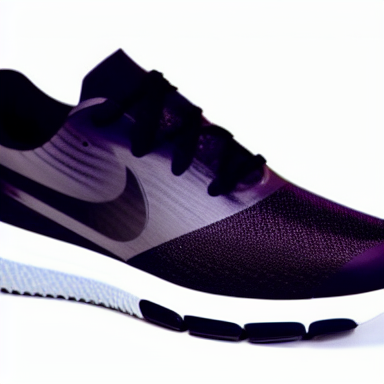

100%|██████████| 10/10 [00:57<00:00,  5.77s/it]


Scheduler: DPMSolverMultistep (65.2s)
  -> ecommerce_generated_images\scheduler_dpmsolvermultistep.png


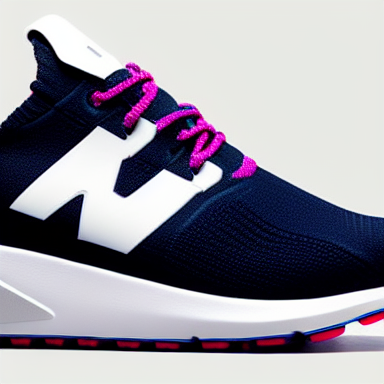

100%|██████████| 10/10 [00:57<00:00,  5.79s/it]


Scheduler: DDIM (65.4s)
  -> ecommerce_generated_images\scheduler_ddim.png


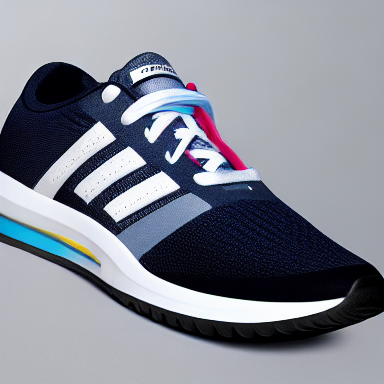

EulerAncestral | DPMSolver | DDIM
  -> ecommerce_generated_images\grid_schedulers.png


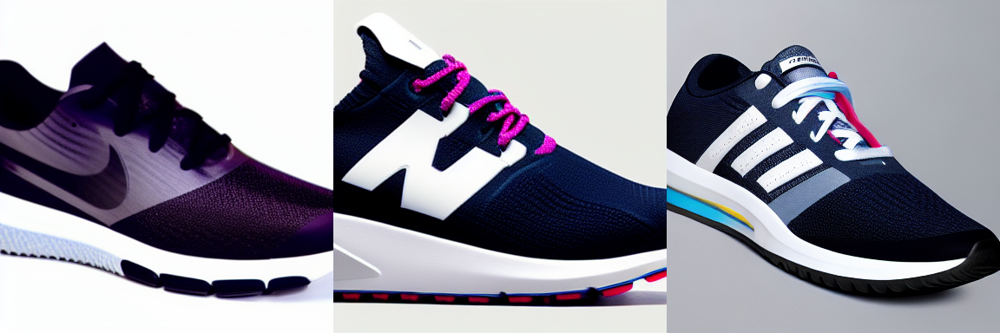


Observaciones cualitativas:
  EulerAncestral  : texturas ligeramente mas organicas, variabilidad entre runs
  DPMSolverMulti  : mas nitido y limpio con mismo numero de steps, muy eficiente
  DDIM            : resultado deterministico y reproducible, puede parecer mas suave

Tiempos: {'EulerAncestral': 66.2, 'DPMSolverMultistep': 65.2, 'DDIM': 65.4}


In [10]:
PROMPT_TEST   = (
    "A high-resolution product photo of modern running sneakers on a white background, "
    "studio lighting, sharp focus, e-commerce style, photorealistic"
)
SEED_TEST     = 42
GUIDANCE_TEST = 7.5

schedulers_config = {
    "EulerAncestral"    : EulerAncestralDiscreteScheduler.from_pretrained(MODEL_ID, subfolder="scheduler"),
    "DPMSolverMultistep": DPMSolverMultistepScheduler.from_pretrained(MODEL_ID, subfolder="scheduler"),
    "DDIM"              : DDIMScheduler.from_pretrained(MODEL_ID, subfolder="scheduler"),
}

imgs_schedulers = {}
tiempos_sched   = {}
for nombre, sched in schedulers_config.items():
    pipe_txt2img.scheduler = sched
    img, t = timed_generate(
        pipe_txt2img, PROMPT_TEST, BASE_NEGATIVE,
        steps=DEFAULT_STEPS, guidance=GUIDANCE_TEST, seed=SEED_TEST
    )
    imgs_schedulers[nombre] = img
    tiempos_sched[nombre]   = t
    save_and_show(img, f"scheduler_{nombre.lower()}.png", f"Scheduler: {nombre} ({t}s)")

# Restaurar scheduler original
pipe_txt2img.scheduler = schedulers_config["EulerAncestral"]

grid_sched = make_image_grid(list(imgs_schedulers.values()), rows=1, cols=3)
save_and_show(grid_sched, "grid_schedulers.png",
              "EulerAncestral | DPMSolver | DDIM")

print("\nObservaciones cualitativas:")
print("  EulerAncestral  : texturas ligeramente mas organicas, variabilidad entre runs")
print("  DPMSolverMulti  : mas nitido y limpio con mismo numero de steps, muy eficiente")
print("  DDIM            : resultado deterministico y reproducible, puede parecer mas suave")
print(f"\nTiempos: {tiempos_sched}")

## 8. Image-to-Image — Variaciones de producto

Aplicamos img2img tanto a las **zapatillas** como al **bolso** para demostrar
que la técnica generaliza a distintos tipos de producto.

In [11]:
# Reutilizamos pesos del pipeline txt2img sin coste extra de VRAM
pipe_img2img = StableDiffusionImg2ImgPipeline(
    vae               = pipe_txt2img.vae,
    text_encoder      = pipe_txt2img.text_encoder,
    tokenizer         = pipe_txt2img.tokenizer,
    unet              = pipe_txt2img.unet,
    scheduler         = pipe_txt2img.scheduler,
    feature_extractor = getattr(pipe_txt2img, "feature_extractor", None),
    requires_safety_checker = False,
    safety_checker    = None,
).to(DEVICE)
pipe_img2img.enable_attention_slicing()
print("Pipeline img2img listo.")

Pipeline img2img listo.


=== Img2Img: zapatillas ===


100%|██████████| 6/6 [00:36<00:00,  6.08s/it]


zap_azul_marino
  -> ecommerce_generated_images\zap_azul_marino.png


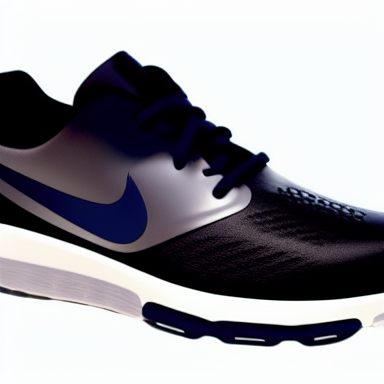

100%|██████████| 7/7 [00:41<00:00,  5.96s/it]


zap_dorado
  -> ecommerce_generated_images\zap_dorado.png


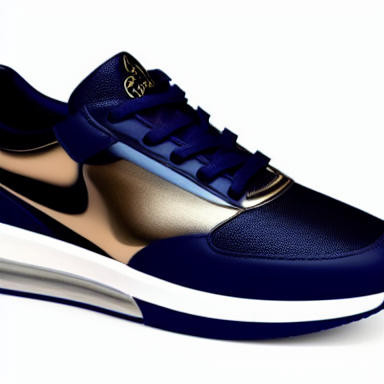

100%|██████████| 7/7 [00:42<00:00,  6.06s/it]


zap_camuflaje
  -> ecommerce_generated_images\zap_camuflaje.png


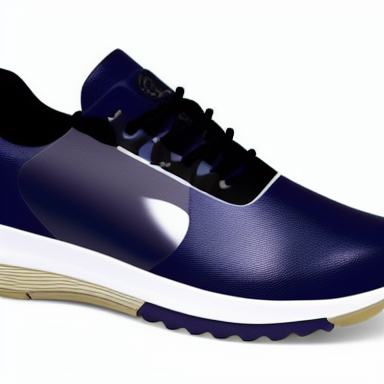

Img2Img zapatillas: Original | Azul | Dorado | Camuflaje
  -> ecommerce_generated_images\grid_img2img_zapatillas.png


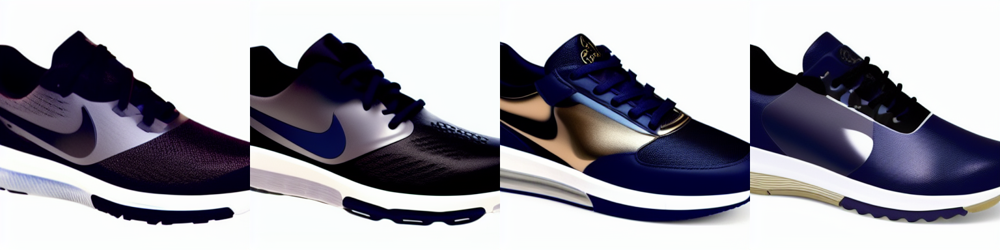


=== Img2Img: bolso ===


100%|██████████| 6/6 [00:34<00:00,  5.79s/it]


bolso_rojo
  -> ecommerce_generated_images\bolso_rojo.png


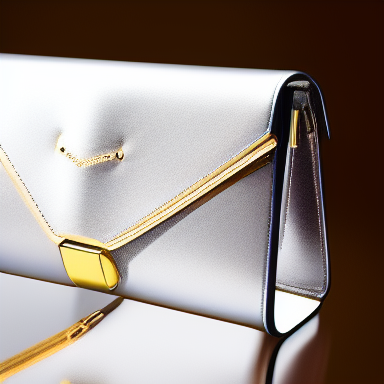

100%|██████████| 6/6 [00:34<00:00,  5.76s/it]


bolso_vegano
  -> ecommerce_generated_images\bolso_vegano.png


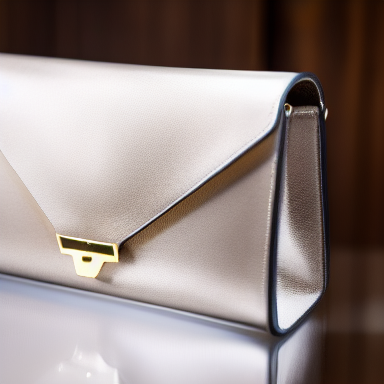

Img2Img bolso: Original | Rojo | Verde vegano
  -> ecommerce_generated_images\grid_img2img_bolso.png


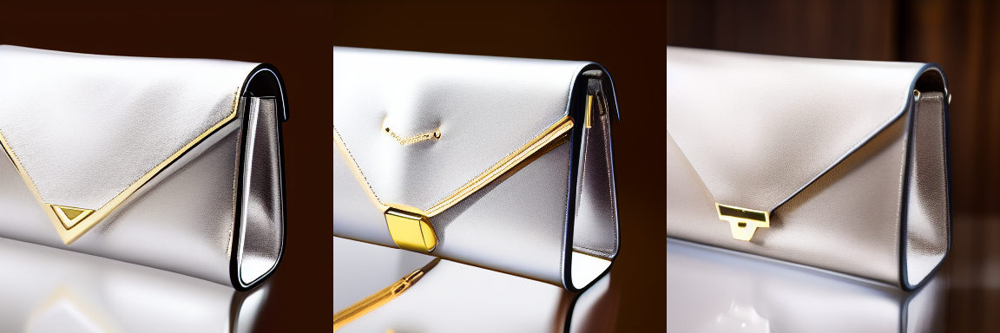

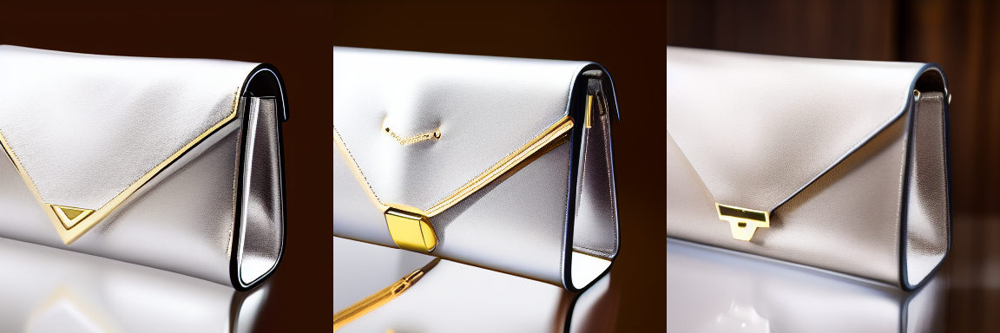

In [12]:
def generate_variation(pipe, init_image, prompt, negative_prompt,
                       strength=0.65, guidance=7.5, seed=42):
    generator = torch.Generator(device=DEVICE).manual_seed(seed)
    result = pipe(
        prompt              = prompt,
        negative_prompt     = negative_prompt,
        image               = init_image,
        strength            = strength,
        num_inference_steps = DEFAULT_STEPS,
        guidance_scale      = guidance,
        generator           = generator,
    )
    return result.images[0]


# -- Variaciones de zapatillas ---------------------------------------------
print("=== Img2Img: zapatillas ===")
variaciones_zap = {
    "zap_azul_marino" : ("Running sneakers in deep navy blue, white background, studio photography, photorealistic", 0.65, 43),
    "zap_dorado"      : ("Luxury golden sneakers with metallic finish, white background, product photo, photorealistic", 0.70, 44),
    "zap_camuflaje"   : ("Sneakers with military camouflage pattern, white background, e-commerce photo, photorealistic", 0.70, 45),
}
imgs_zap_i2i = [img_zapatillas]
for nombre, (prompt, strength, seed) in variaciones_zap.items():
    img = generate_variation(pipe_img2img, img_zapatillas, prompt, BASE_NEGATIVE, strength=strength, seed=seed)
    imgs_zap_i2i.append(img)
    save_and_show(img, f"{nombre}.png", nombre)

grid_zap = make_image_grid(imgs_zap_i2i, rows=1, cols=4)
save_and_show(grid_zap, "grid_img2img_zapatillas.png",
              "Img2Img zapatillas: Original | Azul | Dorado | Camuflaje")

# -- Variaciones de bolso --------------------------------------------------
print("\n=== Img2Img: bolso ===")
variaciones_bolso = {
    "bolso_rojo"    : ("Luxury red leather handbag with gold accents, white background, studio photography, photorealistic", 0.60, 50),
    "bolso_vegano"  : ("Modern vegan leather handbag in olive green, minimalist style, white background, product photo", 0.65, 51),
}
imgs_bolso_i2i = [img_bolso]
for nombre, (prompt, strength, seed) in variaciones_bolso.items():
    img = generate_variation(pipe_img2img, img_bolso, prompt, BASE_NEGATIVE, strength=strength, seed=seed)
    imgs_bolso_i2i.append(img)
    save_and_show(img, f"{nombre}.png", nombre)

grid_bolso = make_image_grid(imgs_bolso_i2i, rows=1, cols=3)
save_and_show(grid_bolso, "grid_img2img_bolso.png",
              "Img2Img bolso: Original | Rojo | Verde vegano")

## 9. Optimización de parámetros con medición de tiempos

Analizamos `guidance_scale` y `num_inference_steps` registrando el tiempo de cada
generación para cuantificar la relación calidad/tiempo.

=== guidance_scale ===


100%|██████████| 10/10 [00:57<00:00,  5.73s/it]


  guidance=  4.0 |  64.6s | Poco adherido al prompt, colores suaves, aspecto pictórico


100%|██████████| 10/10 [00:57<00:00,  5.75s/it]


  guidance=  7.5 |  64.6s | Equilibrio optimo: coherente con el prompt, sin artefactos


100%|██████████| 10/10 [00:58<00:00,  5.83s/it]


  guidance= 12.0 |  65.5s | Muy fiel al prompt, contraste alto, posibles artefactos en bordes


100%|██████████| 10/10 [00:58<00:00,  5.86s/it]


  guidance= 16.0 |  65.8s | Sobreajuste: colores saturados, artefactos evidentes, ruido
Guidance: 4.0 | 7.5 | 12.0 | 16.0
  -> ecommerce_generated_images\grid_guidance_scale.png


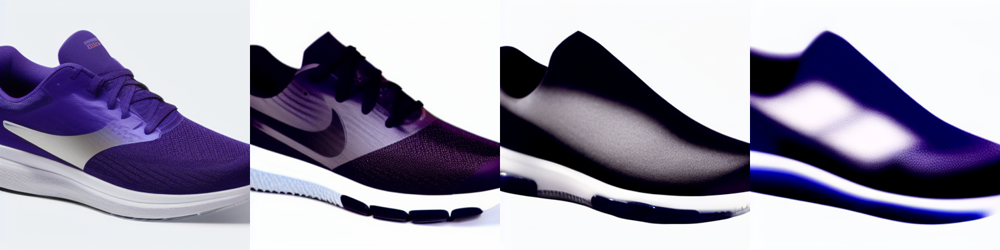


=== num_inference_steps ===


100%|██████████| 5/5 [00:29<00:00,  5.93s/it]


  steps=  5 |  36.9s | Muy ruidoso, formas apenas reconocibles


100%|██████████| 10/10 [01:18<00:00,  7.90s/it]


  steps= 10 |  86.2s | Estructura visible pero con ruido moderado


100%|██████████| 15/15 [01:26<00:00,  5.79s/it]


  steps= 15 |  94.0s | Calidad aceptable, buen equilibrio velocidad/calidad


100%|██████████| 20/20 [01:56<00:00,  5.83s/it]


  steps= 20 | 123.7s | Mejora marginal respecto al anterior, tiempo notablemente mayor
Steps: 5 | 10 | 15 | 20
  -> ecommerce_generated_images\grid_inference_steps.png


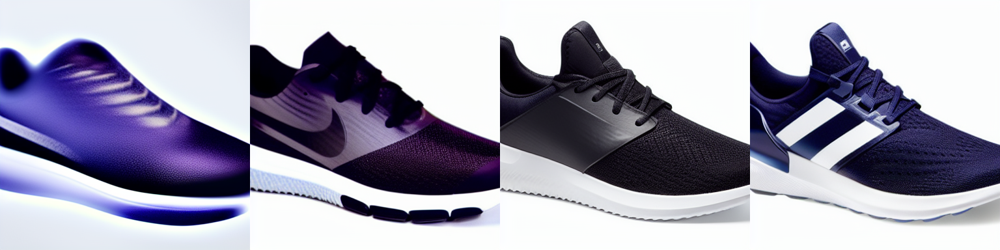


Relacion calidad/tiempo:
  5 steps -> 36.9s
  10 steps -> 86.2s
  15 steps -> 94.0s
  20 steps -> 123.7s


In [13]:
PROMPT_OPT = (
    "A high-resolution product photo of modern running sneakers on a white background, "
    "studio lighting, sharp focus, e-commerce style, photorealistic"
)

# -- Efecto de guidance_scale (steps=DEFAULT_STEPS fijo) ------------------
print("=== guidance_scale ===")
imgs_guidance  = []
obs_guidance   = {
    4.0  : "Poco adherido al prompt, colores suaves, aspecto pictórico",
    7.5  : "Equilibrio optimo: coherente con el prompt, sin artefactos",
    12.0 : "Muy fiel al prompt, contraste alto, posibles artefactos en bordes",
    16.0 : "Sobreajuste: colores saturados, artefactos evidentes, ruido",
}
for gs, obs in obs_guidance.items():
    img, t = timed_generate(pipe_txt2img, PROMPT_OPT, BASE_NEGATIVE,
                            steps=DEFAULT_STEPS, guidance=gs, seed=42)
    imgs_guidance.append(img)
    img.save(os.path.join(OUTPUT_DIR, f"guidance_{gs}.png"))
    print(f"  guidance={gs:5.1f} | {t:5.1f}s | {obs}")

grid_guidance = make_image_grid(imgs_guidance, rows=1, cols=4)
save_and_show(grid_guidance, "grid_guidance_scale.png",
              "Guidance: 4.0 | 7.5 | 12.0 | 16.0")

# -- Efecto de num_inference_steps (guidance=7.5 fijo) --------------------
print("\n=== num_inference_steps ===")
# Valores adaptados: en CPU se usan menos steps para no tardar demasiado
steps_list = [5, 10, 15, 20] if DEVICE == "cpu" else [10, 15, 20, 30]
obs_steps  = {
    steps_list[0]: "Muy ruidoso, formas apenas reconocibles",
    steps_list[1]: "Estructura visible pero con ruido moderado",
    steps_list[2]: "Calidad aceptable, buen equilibrio velocidad/calidad",
    steps_list[3]: "Mejora marginal respecto al anterior, tiempo notablemente mayor",
}
imgs_steps = []
tiempos_steps = {}
for nsteps, obs in obs_steps.items():
    img, t = timed_generate(pipe_txt2img, PROMPT_OPT, BASE_NEGATIVE,
                            steps=nsteps, guidance=7.5, seed=42)
    imgs_steps.append(img)
    tiempos_steps[nsteps] = t
    img.save(os.path.join(OUTPUT_DIR, f"steps_{nsteps}.png"))
    print(f"  steps={nsteps:3d} | {t:5.1f}s | {obs}")

grid_steps = make_image_grid(imgs_steps, rows=1, cols=4)
save_and_show(grid_steps, "grid_inference_steps.png",
              f"Steps: {' | '.join(str(s) for s in steps_list)}")

print("\nRelacion calidad/tiempo:")
for s, t in tiempos_steps.items():
    print(f"  {s} steps -> {t}s")

## 10. Conclusiones

### Scheduler
| Scheduler | Calidad | Velocidad | Mejor para |
|---|---|---|---|
| EulerAncestral | Alta | Media | Uso general, resultados organicos |
| DPMSolverMultistep | Alta | Alta | Prototipado rapido, pocos steps |
| DDIM | Media-alta | Media | Reproducibilidad total, interpolacion |

### Prompts
| Estilo de prompt | Resultado | Recomendado para |
|---|---|---|
| Fondo blanco + studio lighting | Limpio, e-commerce profesional | Tiendas online |
| Top-down + soft shadows | Elegante, minimalista | Moda y lujo |
| Rugged + detailed texture | Robusto, deportivo | Outdoor y deporte |

### Parametros optimos encontrados
- **guidance_scale = 7.5**: mejor equilibrio sin artefactos
- **steps = 15-20**: calidad suficiente para e-commerce con tiempo razonable
- **strength (img2img) = 0.60-0.70**: cambia caracteristicas sin perder estructura del producto

In [14]:
archivos = sorted(os.listdir(OUTPUT_DIR))
print(f"Total de imagenes generadas: {len(archivos)}")
for f in archivos:
    print(f"  {f}")

Total de imagenes generadas: 34
  auriculares_bt.png
  bolso_lujo.png
  bolso_rojo.png
  bolso_vegano.png
  gafas_sol.png
  grid_guidance_scale.png
  grid_img2img_bolso.png
  grid_img2img_zapatillas.png
  grid_inference_steps.png
  grid_productos_adicionales.png
  grid_prompts_comparables.png
  grid_prompts_diversidad.png
  grid_schedulers.png
  guidance_12.0.png
  guidance_16.0.png
  guidance_4.0.png
  guidance_7.5.png
  reloj_lujo.png
  scheduler_ddim.png
  scheduler_dpmsolvermultistep.png
  scheduler_eulerancestral.png
  steps_10.png
  steps_15.png
  steps_20.png
  steps_5.png
  zap_azul_marino.png
  zap_camuflaje.png
  zap_dorado.png
  zapatillas_base.png
  zapatillas_minimalista.png
  zapatillas_outdoor.png
  zapatillas_rojo_neon.png
  zapatillas_rojo_neon_v2.png
  zapatillas_rojo_neon_v3.png
